# Setup

In [10]:
# base
import os
import sys
import gc
import re
import warnings
import logging
import pickle
from time import ctime, time
from datetime import timedelta
from collections import Counter

# data manipulation
import numpy as np
import pandas as pd
import itables
import seaborn as sns
import matplotlib.pyplot as plt
from rpy2.robjects.conversion import localconverter

# single cell
import anndata as ad
import scanpy as sc
# import liana as li
# import celltypist

# custom
from single_cell.R import *
from single_cell.preprocess import *
from single_cell.plot import *
from single_cell.analysis import *
from utils import *

itables.init_notebook_mode(connected=True)  # Use connected=False for offline use
warnings.simplefilter("ignore", FutureWarning)
warnings.simplefilter("ignore", UserWarning)
warnings.simplefilter("ignore", RuntimeWarning)
warnings.simplefilter("ignore", pd.errors.DtypeWarning)
warnings.simplefilter("ignore", pd.errors.PerformanceWarning)
mlogger = logging.getLogger("matplotlib")
mlogger.setLevel(logging.WARNING)

CORES = 10
DATADIR = Path("../../../data")
REFDIR = Path("../../../references")
MAIN_DIR = DATADIR / "processed" / "single cell" / "combined"
SUBSETS_DIR = DATADIR / "processed" / "single cell" / "combined" / "subsets"
DOUBLETMETHODS = ["scDblFinder", "DoubletFinder", "doubletdetection", "scrublet"]
INT_KEY = "INT_harmony-Identifier"

converter = get_converter()
%load_ext rpy2.ipython
%matplotlib inline
# R_preload()
mpl.rcdefaults()
gc.collect()

The rpy2.ipython extension is already loaded. To reload it, use:
  %reload_ext rpy2.ipython


3357

In [2]:
annotation = "integrated_Outer"
adata = ad.read_zarr(DATADIR / "processed" / "single cell" / "combined" / annotation)
print(adata.obs["celltype"].cat.categories)
adata.X = adata.layers["normalized"].copy()
adata

Index(['ASPC', 'adipocyte', 'mesothelium', 'endothelial', 'LEC', 'SMC',
       'pericyte', 'male_epithelial', 'female_epithelial', 'macrophage',
       'monocyte', 'dendritic_cell', 'mast_cell', 'neutrophil', 'b_cell',
       't_cell', 'nk_cell'],
      dtype='object')


AnnData object with n_obs × n_vars = 288258 × 29069
    obs: 'Identifier', 'n_genes', 'Dataset', 'n_counts', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'global_leiden_0.1', 'global_leiden_0.2', 'global_leiden_0.3', 'global_leiden_0.4', 'global_leiden_0.5', 'global_leiden_0.6', 'global_leiden_0.7', 'global_leiden_0.8', 'global_leiden_0.9', 'global_leiden_1.0', 'global_leiden_1.1', 'global_leiden_1.2', 'celltype_So2025', 'celltypist_So2025', 'celltype_Emont2022', 'celltypist_Emont2022', 'predicted_labels', 'majority_voting', 'conf_score', 'over_clustering', 'celltype'
    var: 'n_cells', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm'
    uns: 'PCA', 'PCA_hvg', 'UMAP_INT_harmony-Dataset', 'UMAP_INT_harmony-Identifier', 'UMAP_INT_harmony_hvg-Dataset', 'UMAP_INT_harm

# Macrophages

In [8]:
CELLTYPE_ADDON = "macro"
CLUSTER_KEY = "leiden_macro"
DE_KEY = "macro_DEGs"

Starting UMAP...


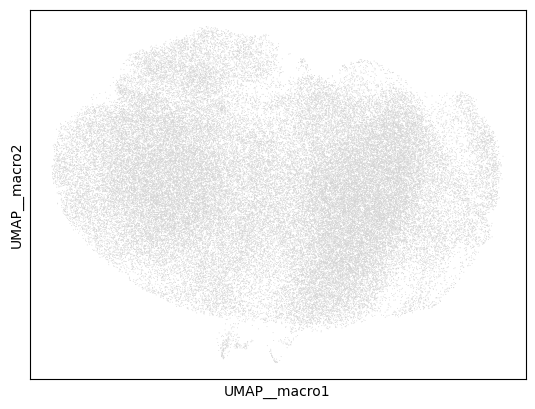

Starting LocalMAP...


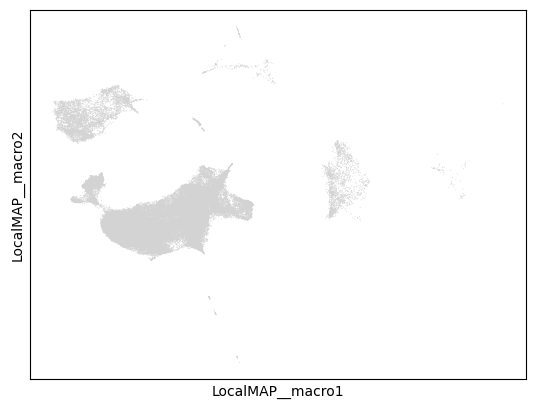

AnnData object with n_obs × n_vars = 71551 × 25264
    obs: 'Identifier', 'n_genes', 'Dataset', 'n_counts', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'global_leiden_0.1', 'global_leiden_0.2', 'global_leiden_0.3', 'global_leiden_0.4', 'global_leiden_0.5', 'global_leiden_0.6', 'global_leiden_0.7', 'global_leiden_0.8', 'global_leiden_0.9', 'global_leiden_1.0', 'global_leiden_1.1', 'global_leiden_1.2', 'celltype_So2025', 'celltypist_So2025', 'celltype_Emont2022', 'celltypist_Emont2022', 'predicted_labels', 'majority_voting', 'conf_score', 'over_clustering', 'celltype'
    var: 'n_cells', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm'
    uns: 'neighbors__macro', 'methods', 'UMAP__macro'
    obsm: 'INT_harmony-Dataset', 'INT_harmony-Identifier', 'INT_harmony_hvg-Dat

In [ ]:
# subset
adata_macro = adata[adata.obs["celltype"] == "macrophage"].copy()
del adata_macro.uns, adata_macro.varm, adata_macro.obsp
sc.pp.filter_cells(adata_macro, min_genes=100)
sc.pp.filter_genes(adata_macro, min_cells=5)
Visualize(adata_macro, CELLTYPE_ADDON, input_key="INT_harmony-Identifier")

Category Dataset has 4 groups!


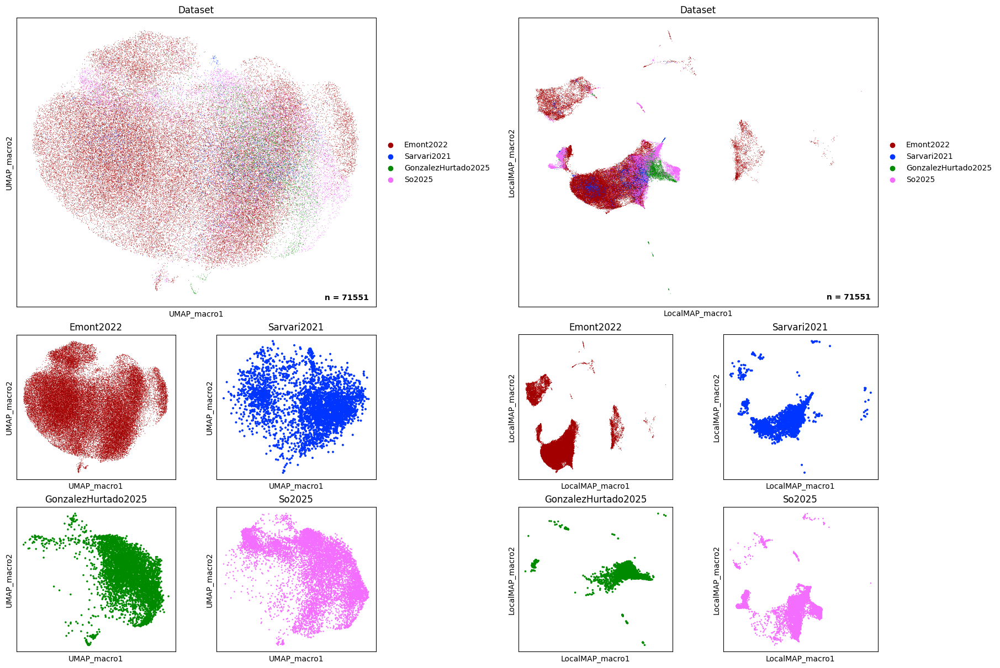

In [29]:
f = plt.figure(figsize=(18, 12), layout="constrained")
check_integration(
    adata_macro,
    "Dataset",
    f,
    embeddings=[f"UMAP_{CELLTYPE_ADDON}", f"LocalMAP_{CELLTYPE_ADDON}"],
    nrow=2,
    ncol=2,
)

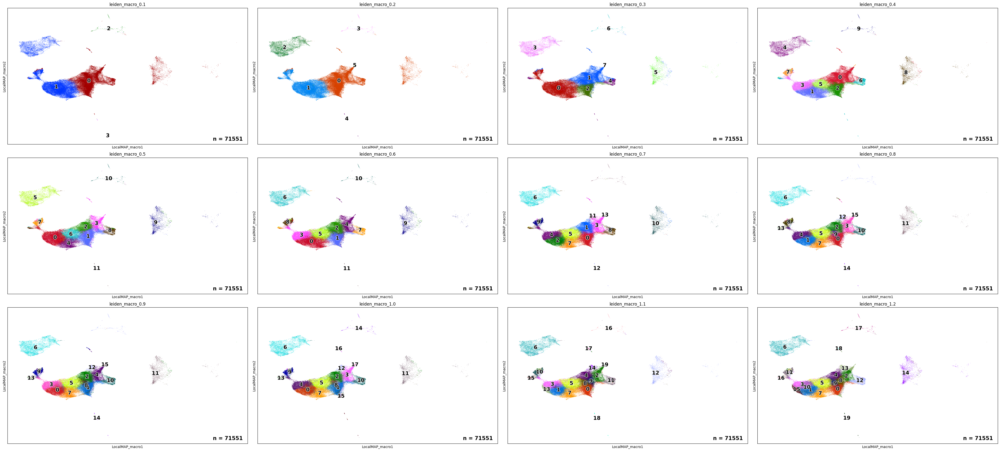

In [31]:
cluster = False
embedding = f"LocalMAP_{CELLTYPE_ADDON}"
resolutions = np.arange(1, 13) / 10

# clsuter
if cluster is True:
    Cluster(adata_macro, CLUSTER_KEY, resolutions, neighbor_key="neighbors_macro")

# plot clusters
r,c = 3,4
f,axs = plt.subplots(r, c, figsize=(10*c,6*r), layout="constrained")
axs = axs.flatten()
for i,res in enumerate(resolutions):
    res_key = f"{CLUSTER_KEY}_{res}"
    cluster_c = color_gen(adata_macro.obs[res_key])

    sc.pl.embedding(
        adata_macro,
        basis=embedding,
        color=res_key,
        ax=axs[i],
        show=False,
        legend_loc="on data",
        legend_fontoutline=2,
        legend_fontsize=15,
        palette=cluster_c,
    )
    axs[i].annotate(
        f"n = {adata_macro.shape[0]}",
        size=15,
        fontweight="bold",
        xy=(0.98, 0.02),
        xycoords="axes fraction",
        horizontalalignment="right",
        verticalalignment="bottom",
    )

In [23]:
plot_cluster_riverplot(adata_macro.obs[f"{CLUSTER_KEY}_0.5"], adata_macro.obs[f"{CLUSTER_KEY}_0.6"])

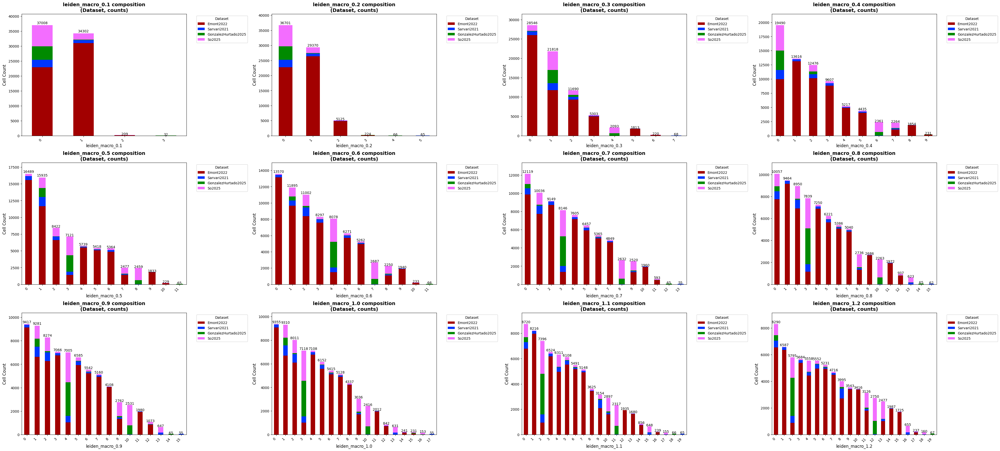

In [ ]:
r,c = 3,4
f,axs = plt.subplots(r, c, figsize=(10*c,6*r), layout="constrained")
axs = axs.flatten()
for i,res in enumerate(resolutions):
    res_key = f"{CLUSTER_KEY}_{res}"
    plot_cluster_stackedbarplot(adata_macro, res_key, "Dataset", ax=axs[i])

In [ ]:
a.	Identity (mostly from publications; take the lists and delete duplicates)
["Arg1, Thbs1, Lyz1, Cd5l, MerTK, Timd4, Fn1, Clec4d, Marco, Itpr1, Slpi, Alox15, CD38"]
Lipo VAMs: Mrc1, Maf, Lpl, MHCII, Lipa, Retnla, Ly6e
Septal Mac: Mrc1, Maf, Lyve1, Cd209f, Cd74, Mgl2
Classical Mono: Ccr2, Ly6c, Cd226
Non-classical: Ccr2, Ly6c, Plac8
Dividing Gonzalez-Hurtado 2025: Mki67, Top2a, Ube2c
Neural Gonzalez-Hurtado 2025: Cd169, Moao, 
Bad-LAM: Gpnmb, Trem2, Ctsd, Ctsl, Cd9, Fabp5, Mmp12, Cd36
OK-LAM: Gpnmb, Mmp12, Cd36
Age-assoc Gonzalez-Hurtado 2025: Cxcl13, C3, Cd55, Ly6e, Ccl8, Colq, Mmp9 
Tissue-resident VAM (septal?): Gonzalez-Hurtado 2025 Lyve1, Cd163, Ednrb, F13a1, Apoe, Cd36, Ccl24, Folr2, Ucp1
b.	Lipophagy
Map1lc3b, Sqstm1, Atgl16l1, Sra1, CD36, Sirt6, Plnpla2, Acadm, B4galnt1, Hadh, Inpp5d, Soat1, Ip6k1, Hacl1, Echs1, Dgkz, Hadhb
c.	Efferocytosis
Mertk, Lrp1, Havcr1, Timd4, Tyro3, Axl, CD36, Cx3cr1, Wdfy3, C1q, Lxr, Pparg
d.	Common IFN response Orecchioni 2019, Gonzalez-Hurtado 2025
Irf9, Irf7, Ifi35, Ifnar2, Isg20, Isg15, Ifit1, Ifit2, Ifih1, Ifnar1, Ifngr2, Cxcl9, Cxcl11, Oas1, Mx1
e.	Type I IFN
Cxcl10, Oas1, Isg15, Mx1, Irf3, Irf7, Ifnb, Il6, Setdb2, 
f.	Type II IFN (tends to activate Type 1 macs, that’s why we see all the IFN response genes there)
Irf1, Stat1, Oas1, Mx1, Bst2, Mafb, 
g.	TGFb response
Pfkl, Arg1, Cebpa, Id3, Retnla, F13a1, Tgfbr1, Pd1, Smad3, Smad7, Cx3cr1, Gcnt2, Pmepa1, Runx3, Axl, F11r, Fcrls, Apoe, Mmp14Kolter 2025
h.	TNF responseKusnadi 2019
Nfkb1, Nfkbia, Ap1, Erk, Jnk, Srebp2, Il1a, Il1b, Il18, Ccl5
Also activates IFN response in late-phase
i.	Type 2 activation/ AAM Orecchioni 2019, Gonzalez-Hurtado 2025
Folr2, Mertk, Arg1, Chil3, Retnla, Raldh, Ucp1, Lpxn, Dhrs3, Mical1, Dnmt3a, Jun, Gab1, and P2ry1. Gab1, Jun, P2ry1, Gab1, Gab2, Glul, Cpta1, Acadm, B4galnt1, Hadh, Inpp5d, Soat1, Ip6k1, Hacl1, Echs1, Dgkz, Hadhb, Parp1, Ptpn22, Cd300a, Cd84
j.	Type 1 activation (LPS ± IFNg)Orecchioni et al 2019
Cd86, Tnfrsf5, Cxcl16, Cxcl9, Il15ra, Il17ra, Icam1, Vcam1, Nfkb1, Rela, Rps6ka2, Tank, Ripk2, Csf2, Il15, Il23a, Irf1, Ifnb1, Csf2, Slc7a2, Slc12a4, Slc1a4, Slc39a14, Slc3a2, Slc4a7 
k.	Non-specific activation markers
Ccl7, Ccl17, Ccl22, and Ccl24, Cd38, Cd44, Cd83


In [ ]:
gonzalez_markers = pd.Series("Ccr2, Chil3, Plac8, Thbs1, Retnla, Lpl, Cd226, Cxcl13, C3, Cd55, Ly6e, Ccl8, Mmp9, Maoa, Cd209a, Itgam, Itgax, Flt3, Dpp4, Zbtb46, Trem2, Spp1, Cxcl9, Cxcl10, Rsad2, Ifit1, Ifit2, Irf7, Isg15".split(", "))
selected_markers = [
    "Ly6e",
    "Arg1",  # Arginase 1
    "Itgax",  # Integrin alpha X (CD11c)
    "Timd4",  # T-cell immunoglobulin and mucin domain containing 4 (TIM-4)
    "H2-Ab1",  # MHC class II (commonly H2-Ab1 for mouse)
    "Maf",  # Maf bZIP transcription factor
    "Mrc1",  # Mannose receptor C type 1 (CD206)
    "Trem2",  # Triggering receptor expressed on myeloid cells 2
    "Fn1",  # Fibronectin 1
    "Cd36",  # CD36 molecule
    "Lipa",  # Lipase A, lysosomal acid, cholesterol esterase
    "Lpl",  # Lipoprotein lipase
    "Siglec1",  # Also known as Cd169
    "Cd163",  # CD163 molecule
    "Retnla",  # Resistin-like alpha (RELMα)
    "Gas6",  # Growth arrest-specific 6
    "Axl",  # AXL receptor tyrosine kinase
    "Mertk",  # MERTK protein tyrosine kinase
    "Cd9",
    "Mgl2",
    "Ccr2"
]

spatial_informed_markers = [
    "Mmp12",
    "Cd9",
    "Lyz1",
    "Cd5l",
    "Il1rn",
    "Ccl9",
    "Clec4d",
    "Cx3cr1",
    "Marco",
    "Trem2",
    "Maf1",
    "S100a4",
]

paper_markers = [
    "Cd209f",
    "Lyve1",
    "Mgl2",
    "Cd74",
    "Gpnmb",
    "Trem2",
    "Itpr1",
    "Cd226",
    "Ccr2",
    "Plac8",
    "Cx3cr1",
    "Slpi",
    "Alox15",
    "Col1a2",
    "Col5a2",
]

In [ ]:
def plot_violinplot(
    adata: AnnData,
    group: str,
    markers: Iterable[str] | dict[str, Iterable[str]],
    f=None,
    layer: str = "normalized",
    useStripPlot=True,
    palette=None,
    bracket_params=None,
    ylabel_size=12,
    xlabel_size=10,
    xlabel_params={"angle": 60, "align": "right"},
):
    is_dict = isinstance(markers, dict)
    marker_list = list(markers.values()) if is_dict else [[m] for m in markers]
    flat_markers = [m for group_markers in marker_list for m in group_markers]
    
    if f:
        axs = f.subplots(len(flat_markers), 1)
    else:
        f, axs = plt.subplots(
            len(flat_markers), 1, figsize=(len(adata.obs[group].unique()), len(flat_markers))
        )

    if type(axs) is not np.ndarray:
        axs = [axs]

    for n, m in tqdm(enumerate(flat_markers)):
        sc.pl.violin(
            adata,
            m,
            groupby=group,
            use_raw=False,
            layer=layer,
            show=False,
            ax=axs[n],
            stripplot=useStripPlot,
            palette=palette,
        )
        if n < len(flat_markers) - 1:
            axs[n].set_xlabel("")
            axs[n].set_xticklabels([""] * len(axs[n].get_xticklabels()))
        axs[n].set_ylabel(axs[n].get_ylabel(), size=ylabel_size)

    if is_dict:
        idx = 0
        for set_name, set_markers in markers.items():
            mid_point = idx + len(set_markers) / 2 - 0.5
            axs[idx].annotate(
                set_name,
                xy=(-0.15, 0.5),
                xytext=(-0.25, mid_point / len(flat_markers)),
                xycoords=axs[idx].transAxes,
                textcoords='figure fraction',
                ha='center',
                va='center',
                rotation=90,
                arrowprops=dict(
                    arrowstyle=f'-[, widthB={(len(set_markers) / len(flat_markers)) * f.get_size_inches()[1] * 72}, lengthB=0.3',
                    lw=1.0,
                    color='k',
                ),
            )
            idx += len(set_markers)

    axs[-1].set_xticklabels(
        axs[-1].get_xticklabels(),
        size=xlabel_size,
        rotation=xlabel_params.get("angle"),
        ha=xlabel_params.get("align"),
        rotation_mode="anchor",
    )

    if bracket_params is not None:
        ratios = bracket_params["ratio"] / np.sum(bracket_params["ratio"])
        ends = np.append(0, np.cumsum(ratios))
        bar_label_locs = [ends[i] + ratios[i] / 2 for i in range(len(ratios))]
        bar_bracket_widths = ratios * f.get_size_inches()[0] * 3.1

        axs = f.get_axes()
        for n, label in enumerate(bracket_params["labels"]):
            axs[-1].annotate(
                label,
                xy=(bar_label_locs[n], -bracket_params["bracket_y"]),
                xytext=(bar_label_locs[n], -bracket_params["label_y"]),
                xycoords="axes fraction",
                ha="center",
                va="bottom",
                bbox=dict(boxstyle="square", fc="none", color="none"),
                arrowprops=dict(
                    arrowstyle=f"-[, widthB={bar_bracket_widths[n]}, lengthB=0.3",
                    lw=1.0,
                    color="k",
                ),
            )
        axs[-1].set_xlabel(axs[-1].get_xlabel(), labelpad=bracket_params["padding"])

    return

[['Flt1', 'Dpp4']]
['Flt1', 'Dpp4']


0it [00:00, ?it/s]

2it [00:02,  1.05s/it]


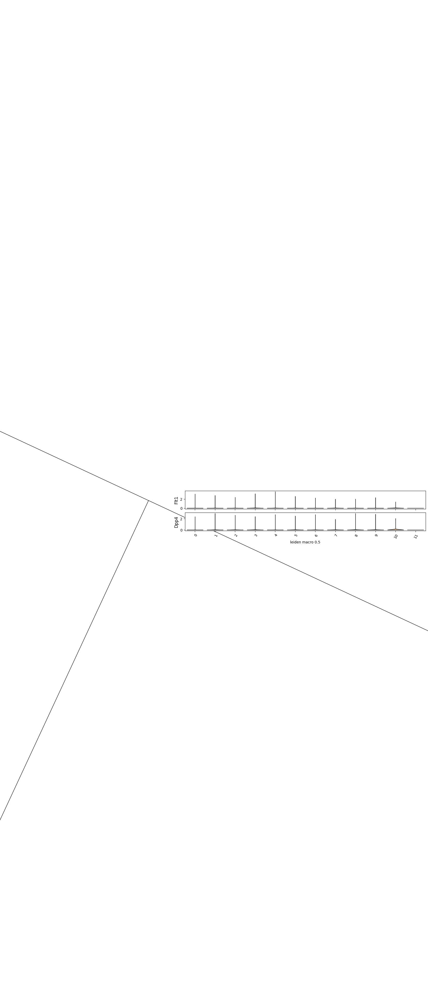

In [16]:
res = 0.5
res_key = f"{CLUSTER_KEY}_{res:.1f}"

plot_violinplot(adata_macro, res_key, {"test" : ["Flt1", "Dpp4"]}, useStripPlot=False)

0it [00:00, ?it/s]

29it [00:39,  1.36s/it]


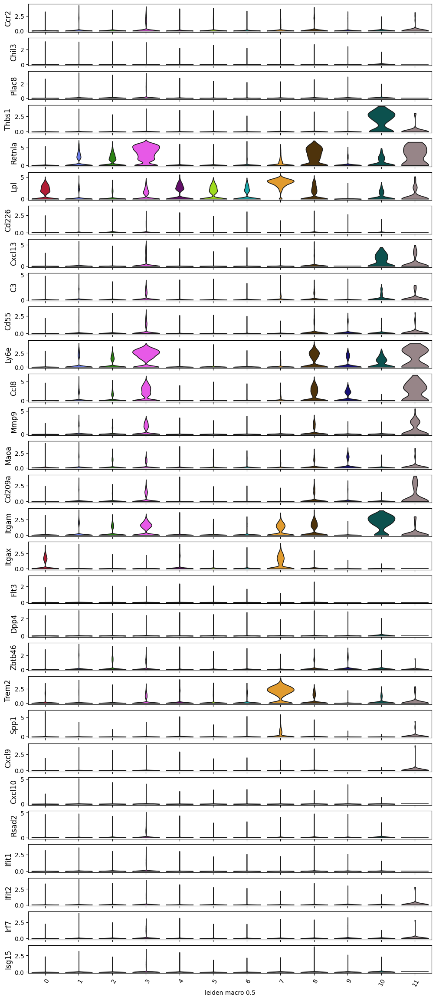

In [ ]:
res = 0.5
res_key = f"{CLUSTER_KEY}_{res:.1f}"

plot_violinplot(adata_macro, res_key, selected_markers+spatial_informed_markers+paper_markers, useStripPlot=False)
# plot_violinplot(adata_macro, res_key, gonzalez_markers, useStripPlot=False)

29it [00:16,  1.74it/s]
29it [00:12,  2.34it/s]
29it [00:10,  2.81it/s]
29it [00:10,  2.87it/s]
29it [00:06,  4.58it/s]
29it [00:08,  3.46it/s]
29it [00:07,  3.86it/s]
29it [00:07,  4.10it/s]
29it [00:05,  5.62it/s]
29it [00:03,  8.83it/s]
29it [00:03,  9.60it/s]
29it [00:01, 18.75it/s]


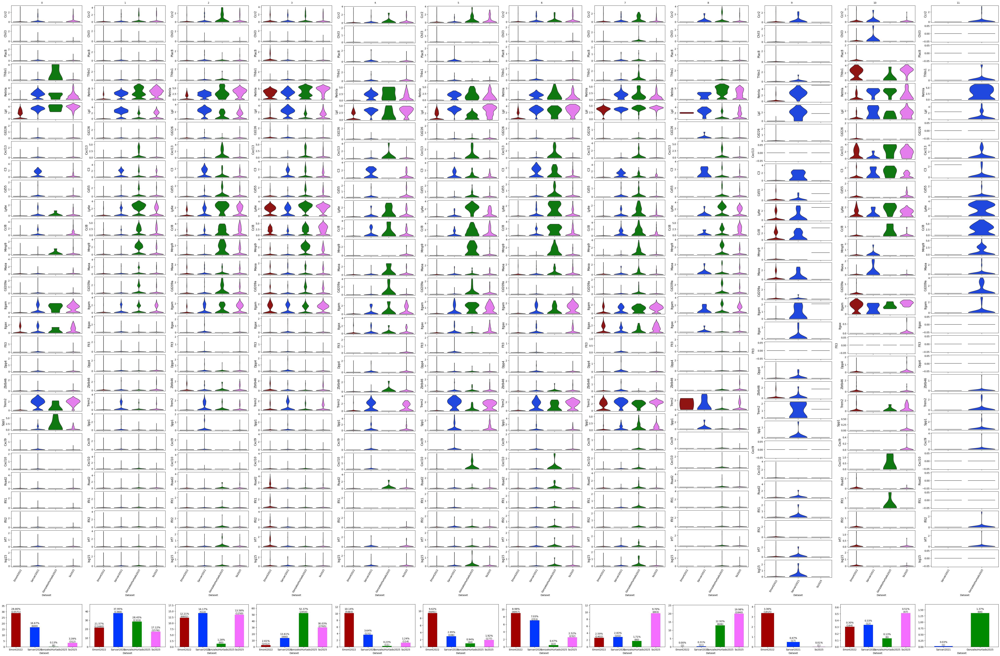

In [181]:
# plot_cluster_violinplot(adata_macro, "Dataset", res_key, selected_markers+spatial_informed_markers+paper_markers)
plot_cluster_violinplot(adata_macro, "Dataset", res_key, gonzalez_markers)

<Axes: >

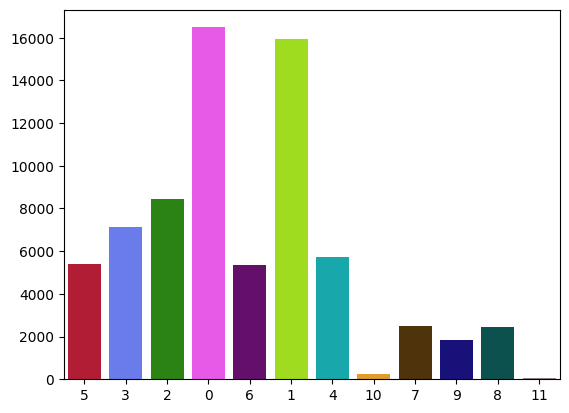

In [90]:
sns.barplot(Counter(adata_macro.obs[res_key]), palette=adata_macro.uns[f"{res_key}_colors"])

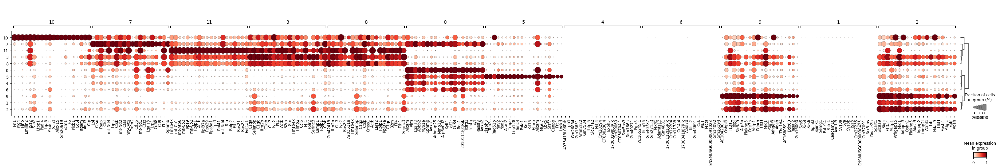

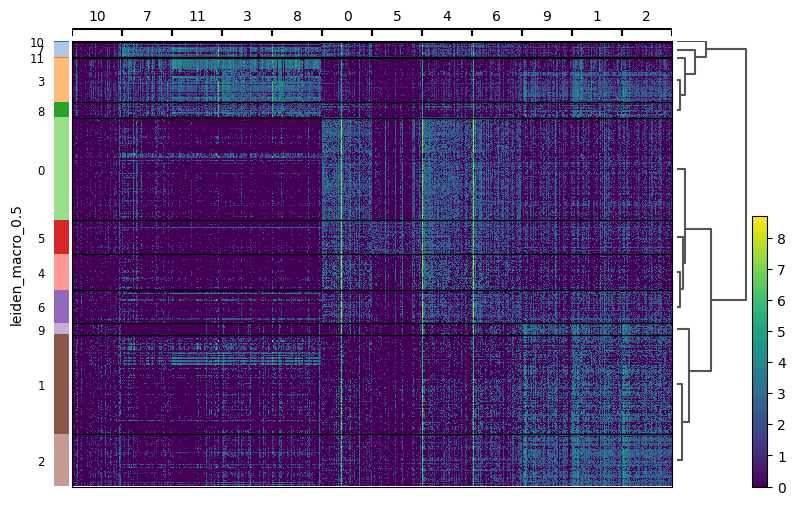

In [ ]:
# original subclusters
res = 0.5
res_key = f"{CLUSTER_KEY}_{res:.1f}"
RUN_DEG = True

# calculate DEGs
if RUN_DEG is True:
    clear_uns(adata_macro, res_key)
    sc.tl.rank_genes_groups(
        adata_macro,
        groupby=res_key,
        key_added=DE_KEY,
        use_raw=False,
        layer="normalized",
        method="wilcoxon",
    )

# plot DEGs
f, ax = plt.subplots(1, 1, figsize=(30, 5), layout="constrained")
sc.pl.rank_genes_groups_dotplot(
    adata_macro,
    groupby=res_key,
    key=DE_KEY,
    standard_scale="var",
    n_genes=20,
    min_logfoldchange=2,
    ax=ax,
    title=f"{res_key}_DEGs"
)
sc.pl.rank_genes_groups_heatmap(
    adata_macro,
    key=DE_KEY,
    groupby=[res_key],
    layer="normalized",
    n_genes=50,
)

## Specific comparisons

In [110]:
subset = adata_macro[adata_macro.obs[res_key].isin(['0','4','6'])]
RUN_DEG = True

# calculate DEGs
if RUN_DEG is True:
    # clear_uns(subset, res_key)
    sc.tl.rank_genes_groups(
        subset,
        groupby=res_key,
        key_added=DE_KEY,
        use_raw=False,
        layer="normalized",
        method="wilcoxon",
    )

# plot DEGs
f, ax = plt.subplots(1, 1, figsize=(30, 5), layout="constrained")
sc.pl.rank_genes_groups_dotplot(
    subset,
    groupby=res_key,
    key=DE_KEY,
    standard_scale="var",
    n_genes=20,
    min_logfoldchange=2,
    ax=ax,
    title=f"{res_key}_DEGs"
)
sc.pl.rank_genes_groups_heatmap(
    subset,
    key=DE_KEY,
    groupby=[res_key],
    layer="normalized",
    n_genes=50,
)

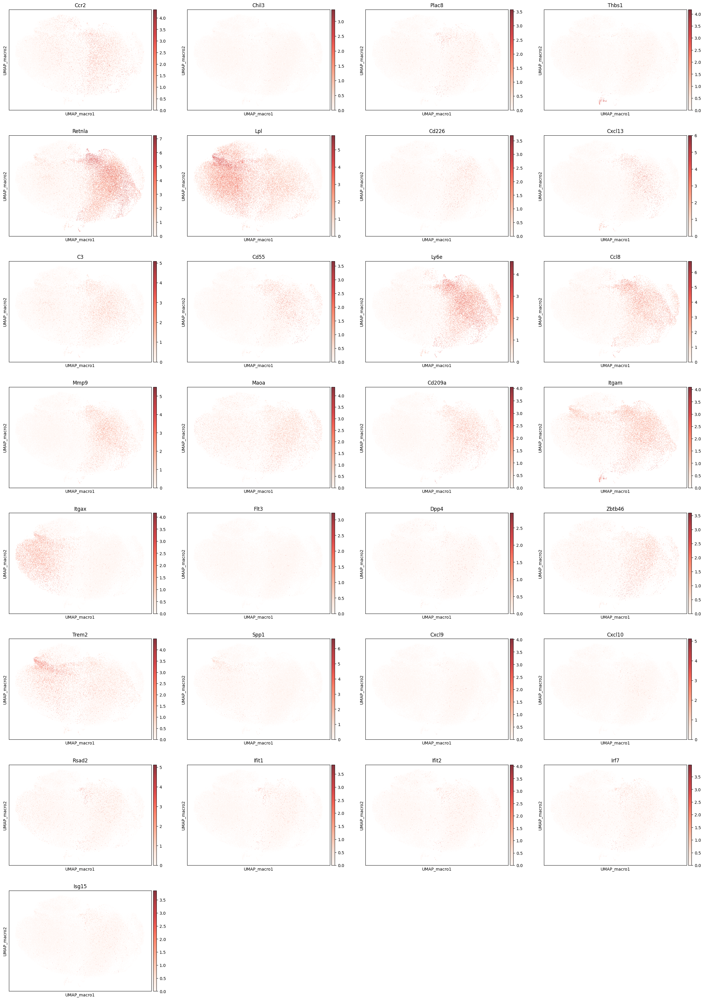

In [185]:
sc.pl.embedding(adata_macro, basis="UMAP_macro", color=gonzalez_markers, cmap="Reds", alpha=0.8)

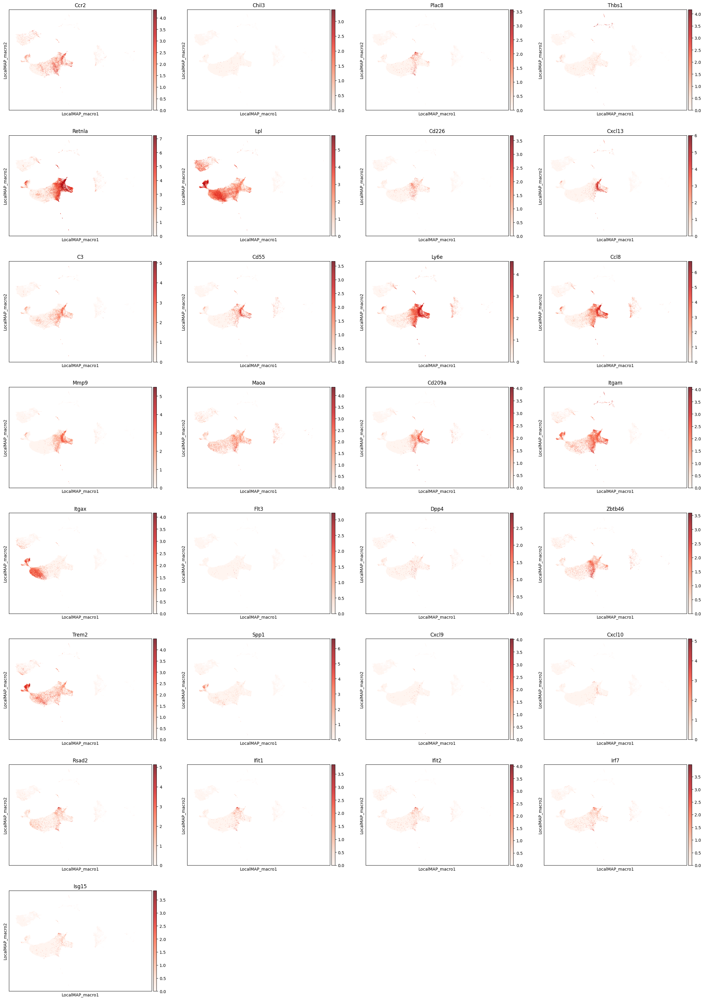

In [184]:
sc.pl.embedding(adata_macro, basis="LocalMAP_macro", color=gonzalez_markers, cmap="Reds", alpha=0.8)

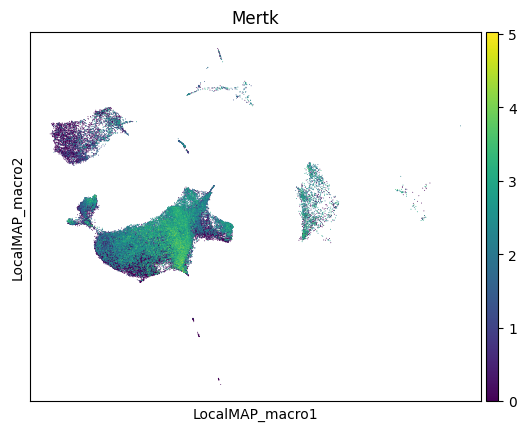

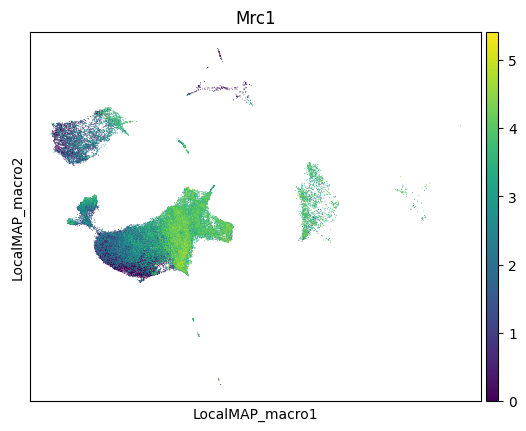

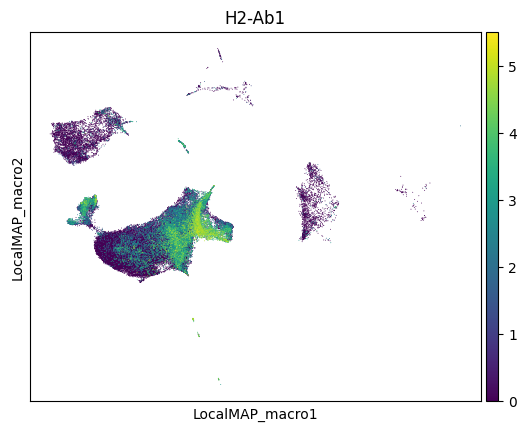

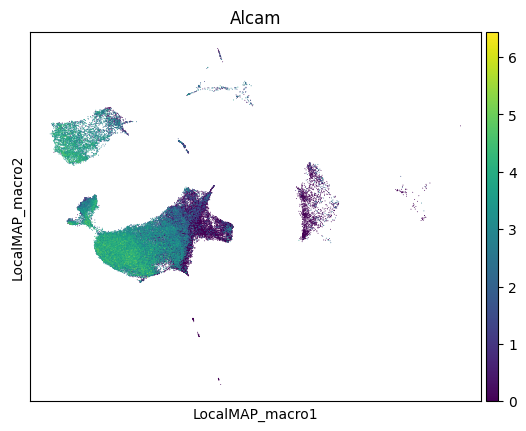

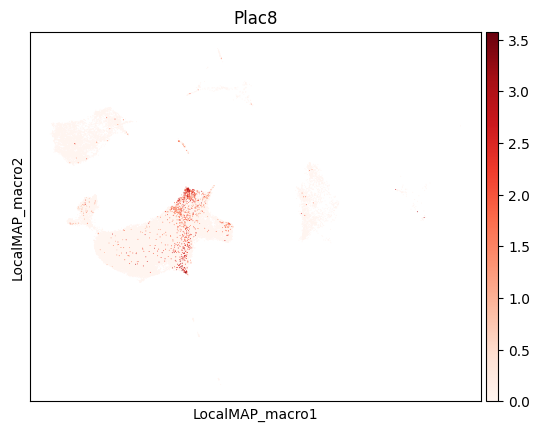

In [131]:
sc.pl.embedding(adata_macro, basis="LocalMAP_macro", color="Mertk", legend_loc="on data")
sc.pl.embedding(adata_macro, basis="LocalMAP_macro", color="Mrc1", legend_loc="on data")
sc.pl.embedding(adata_macro, basis="LocalMAP_macro", color="H2-Ab1", legend_loc="on data")
sc.pl.embedding(adata_macro, basis="LocalMAP_macro", color="Alcam", legend_loc="on data")
sc.pl.embedding(adata_macro, basis="LocalMAP_macro", color="Plac8", legend_loc="on data", cmap="Reds")

In [157]:
import pyucell as uc


gonzalez_supplemental = pd.read_excel(
    REFDIR / "Gonzalez dataset.xlsx",
    sheet_name="Table 2"
)

gonzalez_genelists = {}
for clust in gonzalez_supplemental["cluster"].unique():
    gonzalez_genelists[f"Gonzalez_{clust}"] = gonzalez_supplemental[
        (gonzalez_supplemental["p_val_adj"] < 0.05) & (gonzalez_supplemental["cluster"] == clust)
        ]["gene"].tolist()[:25]

# gonzalez_genelists

uc.compute_ucell_scores(
    adata_macro, signatures=gonzalez_genelists
)
# sc.tl.score_genes(adata, hobson_genelist, score_name="Gonzalez_score")

gc.collect()

59238

In [159]:
# adata_macro.obs["Gonzalez_12_UCell"]
[len(i) for i in gonzalez_genelists.values()]

[25, 25, 25, 25, 25, 25, 25, 25, 25, 25, 25, 25, 25, 25, 25, 25]

16it [00:19,  1.24s/it]


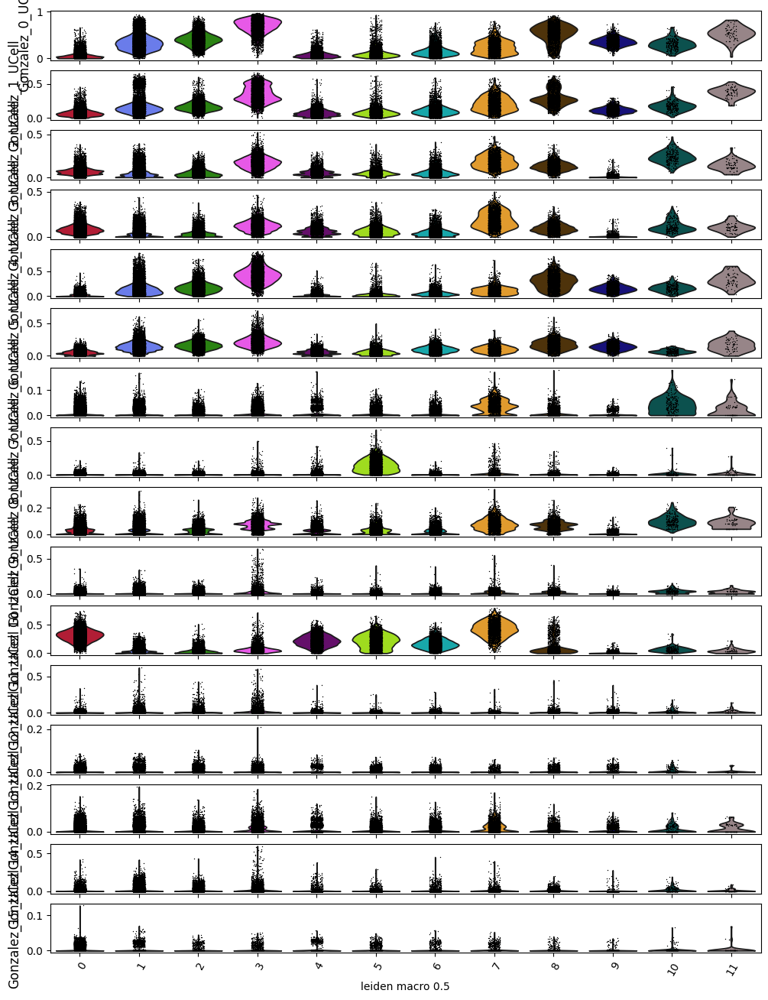

In [163]:
plot_violinplot(adata_macro, res_key, [f"Gonzalez_{i}_UCell" for i in range(16)])

16it [00:06,  2.61it/s]
16it [00:05,  2.95it/s]
16it [00:03,  4.03it/s]
16it [00:03,  5.06it/s]
16it [00:02,  6.01it/s]
16it [00:03,  4.87it/s]
16it [00:03,  5.05it/s]
16it [00:02,  5.64it/s]
16it [00:02,  6.88it/s]
16it [00:01, 10.33it/s]
16it [00:02,  7.85it/s]
16it [00:01, 15.90it/s]


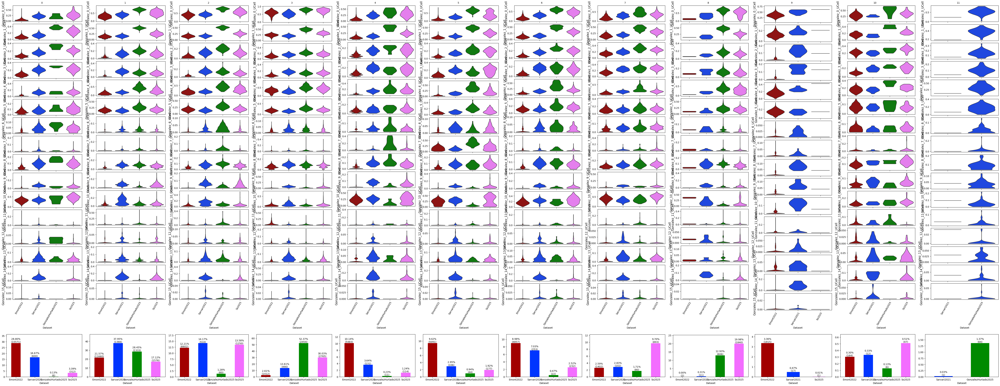

In [162]:
plot_cluster_violinplot(adata_macro, "Dataset", res_key, [f"Gonzalez_{i}_UCell" for i in range(16)])

## Save/Load

In [73]:
adata_macro.write_zarr(SUBSETS_DIR / CELLTYPE_ADDON)

In [5]:
CELLTYPE_ADDON = "macro"
adata_macro = ad.read_zarr(SUBSETS_DIR / CELLTYPE_ADDON)